In [18]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import datetime

In [19]:
circuits = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/circuits.csv')
laptimes = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/lap_times.csv')
pitstops = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/pit_stops.csv')
seasons = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/seasons.csv',parse_dates=['year'])
status = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/status.csv')
constructor_standings = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/constructor_standings.csv')
constructors = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/constructors.csv')
driver_standings = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/driver_standings.csv')
drivers = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/drivers.csv')
races = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/races.csv',parse_dates=['year'])
constructor_results = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/constructor_results.csv')
results = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/results.csv')
qualifying = pd.read_csv('E:\SEM 2\Data_visualization\Assignment_1\Formula_1_dataset/qualifying.csv')

In [20]:
# Checking for missing or null values in each dataframe
print("Missing values in Circuits:", circuits.isnull().sum(), sep='\n')
print("\nMissing values in Lap Times:", laptimes.isnull().sum(), sep='\n')
print("\nMissing values in Pit Stops:", pitstops.isnull().sum(), sep='\n')
print("\nMissing values in Seasons:", seasons.isnull().sum(), sep='\n')
print("\nMissing values in Status:", status.isnull().sum(), sep='\n')
print("\nMissing values in Constructor Standings:", constructor_standings.isnull().sum(), sep='\n')
print("\nMissing values in Constructors:", constructors.isnull().sum(), sep='\n')
print("\nMissing values in Driver Standings:", driver_standings.isnull().sum(), sep='\n')
print("\nMissing values in Drivers:", drivers.isnull().sum(), sep='\n')
print("\nMissing values in Races:", races.isnull().sum(), sep='\n')
print("\nMissing values in Constructor Results:", constructor_results.isnull().sum(), sep='\n')
print("\nMissing values in Results:", results.isnull().sum(), sep='\n')
print("\nMissing values in Qualifying:", qualifying.isnull().sum(), sep='\n')


Missing values in Circuits:
circuitId     0
circuitRef    0
name          0
location      0
country       0
lat           0
lng           0
alt           0
url           0
dtype: int64

Missing values in Lap Times:
raceId          0
driverId        0
lap             0
position        0
time            0
milliseconds    0
dtype: int64

Missing values in Pit Stops:
raceId          0
driverId        0
stop            0
lap             0
time            0
duration        0
milliseconds    0
dtype: int64

Missing values in Seasons:
year    0
url     0
dtype: int64

Missing values in Status:
statusId    0
status      0
dtype: int64

Missing values in Constructor Standings:
constructorStandingsId    0
raceId                    0
constructorId             0
points                    0
position                  0
positionText              0
wins                      0
dtype: int64

Missing values in Constructors:
constructorId     0
constructorRef    0
name              0
nationality       0
ur

In [5]:
# Drop rows where there are missing values 
qualifying_cleaned = qualifying.dropna(subset=['q1', 'q2','q3'])


In [21]:
print("\nMissing values in Qualifying:", qualifying_cleaned.isnull().sum(), sep='\n')


Missing values in Qualifying:
qualifyId        0
raceId           0
driverId         0
constructorId    0
number           0
position         0
q1               0
q2               0
q3               0
dtype: int64


In [22]:
# Creating duplicates of the datasets for demonstration
constructors_dup = constructors.copy()
results_dup = results.copy()

# Merging duplicated dataframes
team = constructors_dup.merge(results_dup, on='constructorId', how='left')

# Filtering and grouping for the duplicated team data
best = team[['name', 'points', 'raceId']]
best = best.groupby('name')['raceId'].nunique().sort_values(ascending=False).reset_index(name='races')
best = best[best['races'] >= 100]  # Considering constructors with at least 100 races

# Define the function to calculate points per race
func_points = lambda x: x['points'].sum() / x['raceId'].nunique()

# Applying the function to the duplicated and filtered dataset
data_filter = team[team['name'].isin(best['name'])].groupby('name').apply(func_points).sort_values(ascending=False).reset_index(name='points_per_race')

# Displaying the top 10 constructors based on points per race from the duplicated dataset
data_filter.head(10)


,name,points_per_race
0,Mercedes,25.299081
1,Red Bull,18.922222
2,Ferrari,9.660666
3,McLaren,6.972626
4,Force India,5.179245
5,Williams,4.461063
6,Renault,4.409429
7,Benetton,3.313462
8,BRM,2.584135
9,Team Lotus,2.518987


In [23]:
team_colors = {
    'Mercedes': 'cyan',  # Close to Turquoise
    'Red Bull': 'blue',  # Closest CSS standard color
    'Ferrari': 'red',
    'McLaren': 'orange',
    'Force India': 'pink',
    'Williams': 'blue',  # Close to Azure
    'Renault': 'yellow',
    'Benetton': 'blue',
    'BRM': 'brown',  # Close to Saddle Brown
    'Team Lotus': 'gold',  # Close to Amber
    'Brabham': 'black',
    'Toyota': 'red',
    'BAR': 'lightblue',  # Close to Sky Blue
    'Toro Rosso': 'blue',  # Close to Royal Blue
    'Alfa Romeo': 'maroon',
    'Tyrrell': 'darkgreen',
    'Haas F1 Team': 'grey',
    'Sauber': 'lightblue',  # Close to Bright Blue
    'Ligier': 'lightgreen',  # Close to Bright Green
    'Jordan': 'yellow',  # Close to Gold
    'March': 'grey',  # Close to Dark Grey
    'Arrows': 'orange',
    'Surtees': 'salmon',  # Close to Light Salmon
    'Fittipaldi': 'navy',
    'Larrousse': 'cyan',  # Close to Turquoise
    'Ensign': 'lightblue',
    'Minardi': 'grey',  # Close to Charcoal
    'ATS': 'orangered',  # Close to Orange Red
    'Osella': 'navy'
}


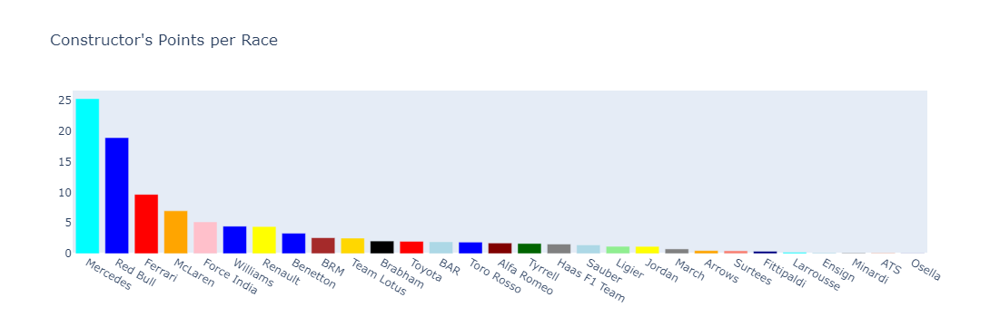

In [24]:

# Creating a list of colors for each team in the order they appear in 'data.name'
color_list = [team_colors[team] for team in data_filter['name']]

# Create the bar chart
fig = go.Figure(
    data=[go.Bar(
        x=data_filter['name'], 
        y=data_filter['points_per_race'],
        marker_color=color_list  # Use the list of colors
    )],
    layout_title_text="Constructor's Points per Race"
)

# Update the layout and display the figure as before
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


In [27]:
print(seasons.columns)
print(drivers.columns)

Index(['year', 'url'], dtype='object')
Index(['driverId', 'driverRef', 'number', 'code', 'forename', 'surname', 'dob',
       'nationality', 'url'],
      dtype='object')


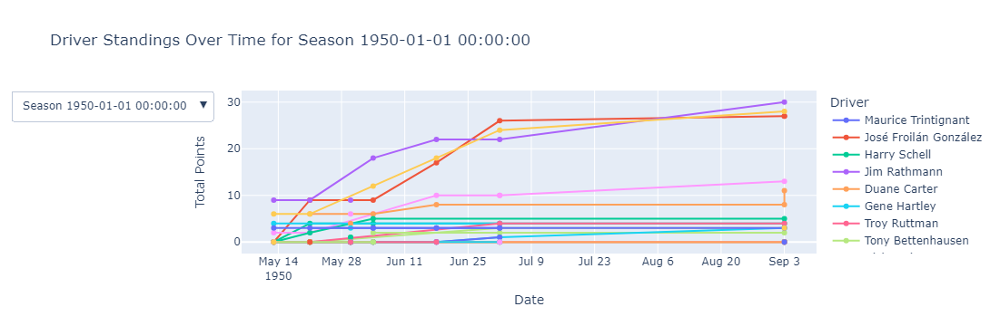

In [29]:
season_results = pd.merge(results, races[['raceId', 'year', 'date']], on='raceId')
driver_results_full = pd.merge(season_results, drivers[['driverId', 'forename', 'surname']], on='driverId')

# Combine the driver's forename and surname for easier plotting
driver_results_full['DriverName'] = driver_results_full['forename'] + ' ' + driver_results_full['surname']

# Ensure the points are in the correct data type
driver_results_full['points'] = pd.to_numeric(driver_results_full['points'], errors='coerce').fillna(0)

# Initialize the figure
fig = go.Figure()


# Merge 'results' with 'races' to associate each result with a specific race and season
season_results = pd.merge(results, races[['raceId', 'year', 'date']], on='raceId')

# Merge with 'drivers' to get driver names
driver_results_full = pd.merge(season_results, drivers[['driverId', 'forename', 'surname']], on='driverId')

# Combine the driver's forename and surname for easier plotting
driver_results_full['DriverName'] = driver_results_full['forename'] + ' ' + driver_results_full['surname']

# Ensure the points are in the correct data type
driver_results_full['points'] = pd.to_numeric(driver_results_full['points'], errors='coerce').fillna(0)


# Create sorted list of seasons to ensure consistency
sorted_seasons = sorted(driver_results_full['year'].unique())

# Store visibility of traces (all False initially)
traces_visibility = {season: [] for season in sorted_seasons}

# Add traces for each driver for each season
for season in sorted_seasons:
    season_data = driver_results_full[driver_results_full['year'] == season]
    drivers_in_season = season_data['DriverName'].unique()
    for driver in drivers_in_season:
        driver_data = season_data[season_data['DriverName'] == driver].sort_values('date')
        cumulative_points = driver_data['points'].cumsum()
        # Add trace, set to visible if it's the first season
        trace = go.Scatter(
            x=driver_data['date'], 
            y=cumulative_points, 
            mode='lines+markers', 
            name=driver,
            visible=(season == sorted_seasons[0])  # Only the first season is visible initially
        )
        fig.add_trace(trace)
        # Record the visibility for this trace across all seasons
        for s in sorted_seasons:
            traces_visibility[s].append(season == s)

# Create buttons for year selection and update layout
buttons = []
for season in sorted_seasons:
    button = dict(
        label=f'Season {season}',
        method='update',
        args=[
            {'visible': traces_visibility[season]},  # Set the correct visibility
            {'title': f'Driver Standings Over Time for Season {season}'}
        ]
    )
    buttons.append(button)

# Update figure with dropdown menus
fig.update_layout(
    updatemenus=[dict(active=0, buttons=buttons)],
    title=f'Driver Standings Over Time for Season {sorted_seasons[0]}',
    xaxis_title='Date',
    yaxis_title='Total Points',
    legend_title='Driver',
    xaxis=dict(type='date'),
    yaxis=dict(type='linear'),
)

# Show figure
fig.show()


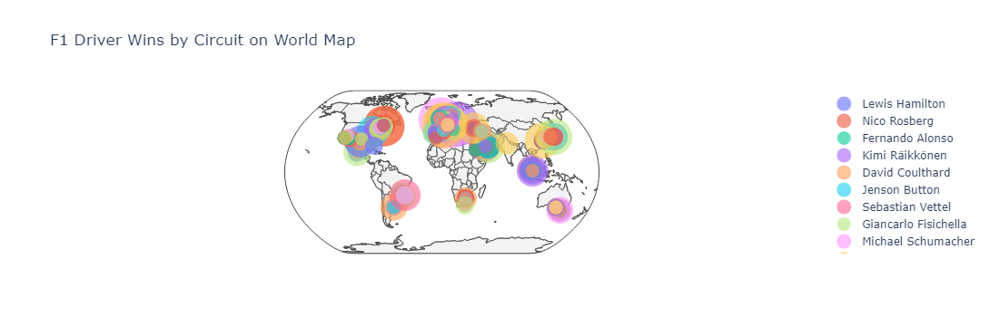

In [30]:

# Merge results with races to get race year and circuit ID
race_results_df = pd.merge(results, races[['raceId', 'year', 'circuitId']], on='raceId')

# Merge above with drivers to get driver names
race_driver_results_df = pd.merge(race_results_df, drivers[['driverId', 'forename', 'surname']], on='driverId')

# Merge with circuits to get circuit locations (longitude and latitude)
full_results_df = pd.merge(race_driver_results_df, circuits[['circuitId', 'name', 'lng', 'lat']], on='circuitId')

# Filter for wins only
wins_df = full_results_df[full_results_df['positionOrder'] == 1]

# Group by driver and circuit to count wins
win_counts = wins_df.groupby(['driverId', 'forename', 'surname', 'circuitId', 'name', 'lng', 'lat']).size().reset_index(name='wins')

# Combine driver's forename and surname for better readability
win_counts['driver_name'] = win_counts['forename'] + ' ' + win_counts['surname']

# Select and rename columns for clarity, again making a copy for safety
win_counts_final = win_counts[['driver_name', 'name', 'lng', 'lat', 'wins']].copy()  # Use .copy() for safe operations
win_counts_final.rename(columns={'name': 'track_name'}, inplace=True)


fig = go.Figure()

# Loop through each track in the win_counts_final dataset
for track in win_counts_final['track_name'].unique():
    track_data = win_counts_final[win_counts_final['track_name'] == track]
    for _, row in track_data.iterrows():
        # Updated text to include both track name and wins
        hover_text = f"{row['driver_name']} - {row['track_name']}: {row['wins']} wins"
        fig.add_trace(go.Scattergeo(
            lon=[row['lng']],
            lat=[row['lat']],
            text=hover_text,  # Hover text includes both driver name and track name
            name=row['driver_name'],  # Set legend to display driver's names
            marker=dict(size=row['wins'] * 5 + 10, opacity=0.6)  # Adjust marker size based on wins
        ))

# Update the layout for a clearer map visualization
fig.update_layout(
    title_text='F1 Driver Wins by Circuit on World Map',
    showlegend=True,
    geo=dict(
        scope='world',
        landcolor='rgb(243, 243, 243)',
        oceancolor='rgb(204, 204, 255)',
        projection_type='natural earth',
        showcountries=True,
        countrycolor='rgb(100, 100, 100)'
    )
)

# Show the updated map
fig.show()



In [31]:
# Merge pit stops with races to get race year and circuitId
pit_stops_races = pd.merge(pitstops, races, left_on='raceId', right_on='raceId')

# Merge with circuits to get location data
pit_stops_races_circuits = pd.merge(pit_stops_races, circuits, left_on='circuitId', right_on='circuitId')


fastest_pitstops = pit_stops_races_circuits.groupby(['circuitId', 'name_y']).agg({'milliseconds': 'min'}).reset_index()

# Assuming 'name_y' is the column for circuit names, adjust if different
fastest_pitstops_locations = fastest_pitstops.merge(circuits, left_on='circuitId', right_on='circuitId')

# Continue with converting milliseconds to seconds for better readability and plotting
fastest_pitstops_locations['seconds'] = fastest_pitstops_locations['milliseconds'] / 1000


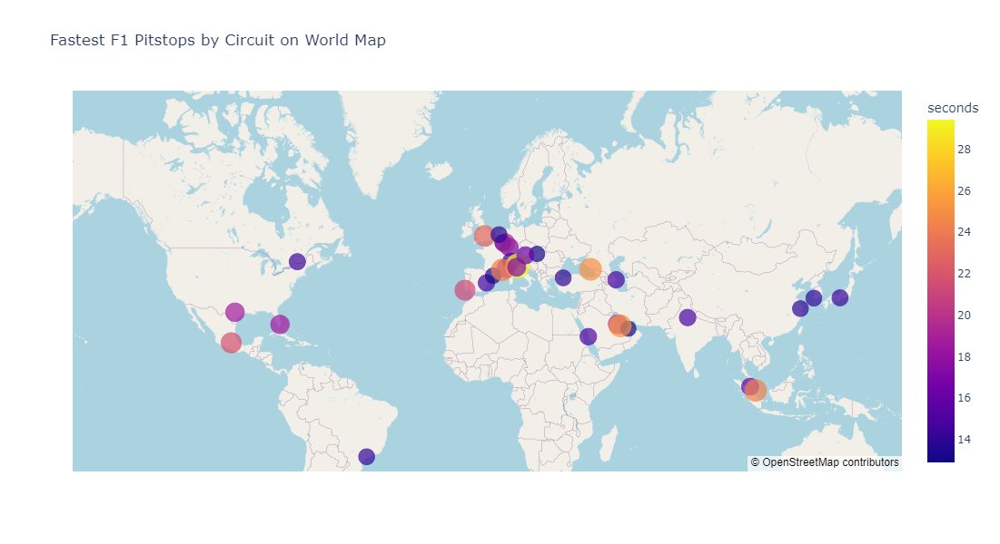

In [32]:
import plotly.express as px

# Assuming 'fastest_pitstops_locations' has been properly prepared with the fastest pitstop data
# Ensure it contains 'lat' and 'lng' for latitude and longitude, respectively, and 'seconds' for the shortest pitstop times

# Create the map
fig = px.scatter_mapbox(fastest_pitstops_locations,
                        lat="lat",  # Use latitude from your dataset
                        lon="lng",  # Use longitude from your dataset
                        color="seconds",  # Color the markers by fastest pitstop time
                        size="seconds",  # Size the markers by fastest pitstop time
                        hover_name="name",  # Display circuit name when hovering over the point
                        zoom=1,  # Global view, adjust as necessary
                        center={"lat": 40, "lon": 0},  # Centering on a neutral global position
                        height=600,
                        width=800,
                        title="Fastest F1 Pitstops by Circuit on World Map")

# Set the mapbox style to 'open-street-map' or other available styles
fig.update_layout(mapbox_style="open-street-map")  # Use the open-street map style
fig.show()


In [33]:
# Merge results with status to see the status of each driver in each race
accidents_data = pd.merge(results, status, left_on='statusId', right_on='statusId')

# Considering statuses indicating an accident
accidents_data = pd.merge(accidents_data, races[['raceId', 'circuitId']], on='raceId', how='left')

# Count accidents per circuitId 
accidents_per_circuit = accidents_data.groupby('circuitId')['raceId'].count().reset_index()
accidents_per_circuit.columns = ['circuitId', 'Accidents']

# Merge with circuits to get location names
accidents_per_circuit = pd.merge(accidents_per_circuit, circuits, on='circuitId')

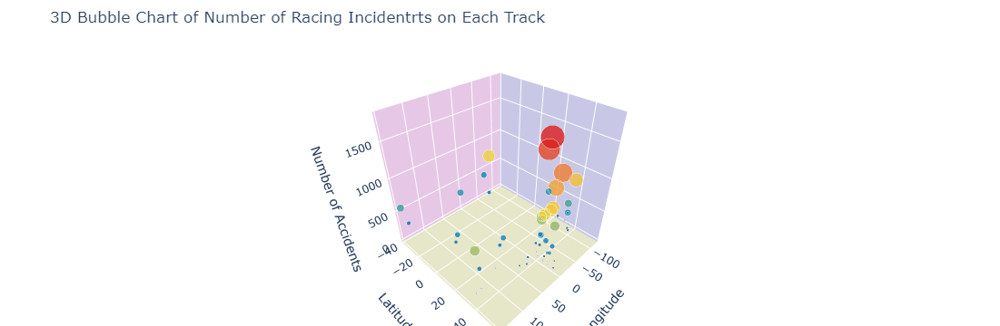

In [34]:

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=accidents_per_circuit['lng'],  # Use longitude for x-axis
            y=accidents_per_circuit['lat'],  # Use latitude for y-axis
            z=accidents_per_circuit['Accidents'],  # Use number of accidents for z-axis
            mode='markers',  # Type of plot
            marker=dict(
                size=accidents_per_circuit['Accidents'],  # Use accidents to determine the size of the bubble
                sizemode='diameter',  # Specify how size is determined (by diameter here)
                sizeref=accidents_per_circuit['Accidents'].max() / 30,  # Reference for size scaling
                color=accidents_per_circuit['Accidents'],  # Use number of accidents for color scale
                colorscale='Portland',  # Color scale
                opacity=0.8
            ),
            text=accidents_per_circuit['name'],  # Text to show on hover, circuit names
            hoverinfo='text+x+y+z'  # Information to show on hover
        )
    ]
)


fig.update_layout(
    title='3D Bubble Chart of Number of Racing Incidentrts on Each Track',
    scene=dict(
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Number of Accidents',
        xaxis=dict(backgroundcolor="rgb(200, 200, 230)"),
        yaxis=dict(backgroundcolor="rgb(230, 200,230)"),
        zaxis=dict(backgroundcolor="rgb(230, 230,200)")
    ),
    margin=dict(l=0, r=0, b=0, t=50)  # Adjust margins
)

fig.show()


In [35]:

driver_position = drivers.merge(driver_standings, left_on='driverId', right_on='driverId', how='left')
driver_position = driver_position.merge(races, on='raceId', how='left')

positions = driver_position[driver_position['position'] == 1].groupby(
    ['surname', 'year'])['wins'].max().sort_values(ascending=False).reset_index(name='Wins')

positions.rename(columns={'surname': 'Name'}, inplace=True)
positions['Wins'] = positions['Wins'].astype('int64')

positions.head(20)


,Name,year,Wins
0,Verstappen,2022-01-01,15
1,Vettel,2013-01-01,13
2,Schumacher,2004-01-01,13
3,Hamilton,2014-01-01,11
4,Hamilton,2020-01-01,11
5,Schumacher,2002-01-01,11
6,Hamilton,2018-01-01,11
7,Vettel,2011-01-01,11
8,Hamilton,2019-01-01,11
9,Verstappen,2023-01-01,10


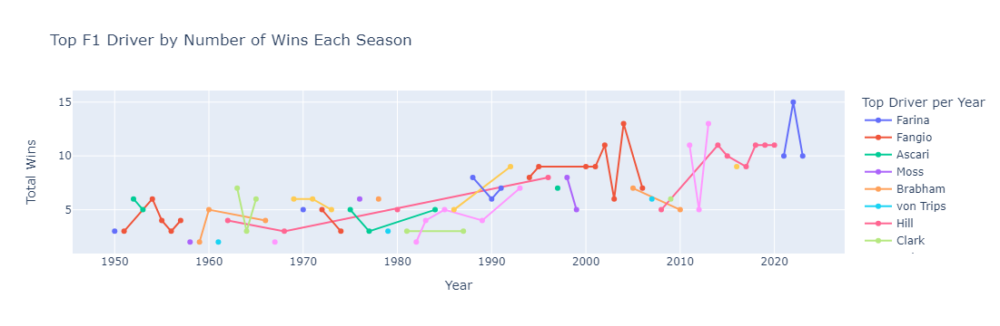

In [36]:
top_wins_per_year = positions.sort_values('Wins', ascending=False).drop_duplicates(['year'])


# Sorting values by year to make sure the data is in order
top_wins_per_year = top_wins_per_year.sort_values('year')

# Plotting
fig = px.line(top_wins_per_year, x='year', y='Wins', color='Name',
              labels={'Wins': 'Total Wins', 'year': 'Year', 'Name': 'Driver'},
              title='Top F1 Driver by Number of Wins Each Season',
              markers=True)  # Add markers for better visibility

# Update layout for a cleaner look
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Total Wins",
    legend_title="Top Driver per Year",
    hovermode='x unified'
)

# Show the plot
fig.show()

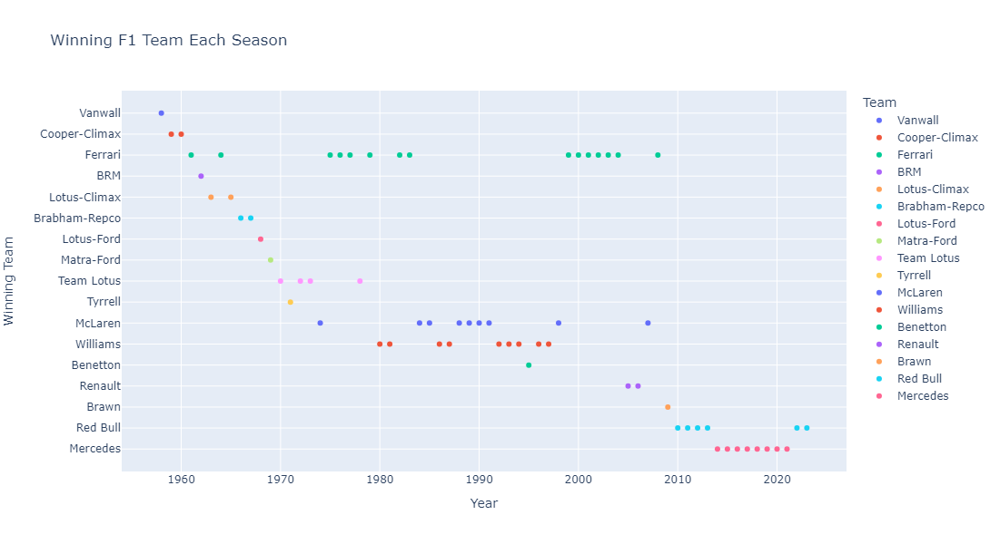

In [37]:

# Merge the races DataFrame with the constructor standings to get the year for each standing
constructor_standings_with_year = pd.merge(constructor_standings, races[['raceId', 'year']], on='raceId', how='left')

# Now, determine the winning constructor (team) for each year based on maximum points

season_winners = constructor_standings_with_year.sort_values(by=['year', 'points'], ascending=[True, False]).drop_duplicates(['year'])

# Merge season_winners with constructors_df to get the name of the winning team
season_winners = season_winners.merge(constructors, on='constructorId', how='left')

# Plotting the winning team for each season

fig = px.scatter(season_winners, x='year', y='name', color='name', 
                 labels={'year': 'Year', 'name': 'Team Name'}, 
                 title='Winning F1 Team Each Season',
                 size_max=60, height=600)

# Update layout for better readability
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Winning Team",
    legend_title="Team",
    hovermode='closest'
)

# Show the plot
fig.show()


In [38]:
# Sort the data first by year and then by round to get the order of the race tracks for each season
races_ordered = races.sort_values(by=['year', 'round'], ascending=[True, True])

# Group the data by 'year' and create a summary for each season that includes round and track name
rounds_tracks_per_season = races_ordered.groupby('year').apply(
    lambda x: x[['round', 'name']].apply(lambda y: f"Round {y['round']}: {y['name']}", axis=1).tolist()
).reset_index(name='rounds_and_tracks')

# Display the DataFrame
print(rounds_tracks_per_season)


         year                                  rounds_and_tracks
0  1950-01-01  [Round 1: British Grand Prix, Round 2: Monaco ...
1  1951-01-01  [Round 1: Swiss Grand Prix, Round 2: Indianapo...
2  1952-01-01  [Round 1: Swiss Grand Prix, Round 2: Indianapo...
3  1953-01-01  [Round 1: Argentine Grand Prix, Round 2: India...
4  1954-01-01  [Round 1: Argentine Grand Prix, Round 2: India...
..        ...                                                ...
69 2019-01-01  [Round 1: Australian Grand Prix, Round 2: Bahr...
70 2020-01-01  [Round 1: Austrian Grand Prix, Round 2: Styria...
71 2021-01-01  [Round 1: Bahrain Grand Prix, Round 2: Emilia ...
72 2022-01-01  [Round 1: Bahrain Grand Prix, Round 2: Saudi A...
73 2023-01-01  [Round 1: Bahrain Grand Prix, Round 2: Saudi A...

[74 rows x 2 columns]


In [52]:
from ipywidgets import interact, Dropdown
import plotly.graph_objects as go

races_ordered = pd.merge(races_ordered, circuits[['circuitId', 'lat', 'lng']], on='circuitId', how='left')

unique_seasons = sorted(races_ordered['year'].unique())

# Create the Dropdown widget for season selection
season_dropdown = Dropdown(
    options=unique_seasons,  # Set the options to the unique seasons
    value=unique_seasons[0],  # Set the default value to the first season in the list
    description='Season:',  # Set the description that appears on the left of the dropdown
    disabled=False,  # Ensure the dropdown is enabled (users can interact with it)
)

# Function to update the GIS plot based on the selected season
def update_gis(selected_season):
    # Filter the data for the selected season
    season_data = races_ordered[races_ordered['year'] == selected_season]
    
    # Combine round number and track name for hover text
    hover_text = ['Round ' + str(round) + ': ' + name for round, name in zip(season_data['round'], season_data['name'])]
    
    # Create a new figure for the geographic plot using Scattermapbox
    fig = go.Figure(go.Scattermapbox(
        lon=season_data['lng'],  # Longitude data
        lat=season_data['lat'],  # Latitude data
        mode='markers+lines',
        marker=dict(
            size=9,
            color='red',  # Change as needed
        ),
        text=hover_text,  # Use the combined hover text
        name=f'Season {selected_season}'
    ))
    
    # Set up the layout of the figure
    fig.update_layout(
        mapbox_style="open-street-map",  # Or "light", "dark", "satellite", etc.
        mapbox=dict(
            center=go.layout.mapbox.Center(
                lat=season_data['lat'].mean(),  # Center of the map
                lon=season_data['lng'].mean()  # Center of the map
            ),
            zoom=3  # Adjust the zoom level as needed
        ),
        title=f'Races for Season {selected_season}',
        showlegend=True,
        margin=dict(t=0, b=0, l=0, r=0)
    )
    
    # Display the figure
    fig.show()

# Set up the interaction between the widget and the update function
interact(update_gis, selected_season=season_dropdown)


interactive(children=(Dropdown(description='Season:', options=(Timestamp('1950-01-01 00:00:00'), Timestamp('19…

<function __main__.update_gis(selected_season)>

In [45]:
import plotly.graph_objects as go
import ipywidgets as widgets
from IPython.display import display, clear_output

# Create a new 'full_name' column in the drivers DataFrame
drivers['full_name'] = drivers['forename'] + ' ' + drivers['surname']

# Update the driver dropdown to use full names
driver_dropdown = widgets.Dropdown(
    options=[(name, ref) for name, ref in zip(drivers['full_name'], drivers['driverRef'])],
    description='Select a driver:',
    disabled=False,
)

out = widgets.Output()
# Update the update_plot function to handle the selected full name
def update_plot(change):
    selected_driver_ref = change if isinstance(change, str) else change['new']  # Here 'change' will be 'driverRef'
    selected_driver_id = drivers[drivers['driverRef'] == selected_driver_ref]['driverId'].iloc[0]
    selected_driver_standings = driver_standings[driver_standings['driverId'] == selected_driver_id]

    # Calculate total wins and podiums as before
    total_wins = selected_driver_standings[selected_driver_standings['position'] == 1]['position'].count()
    total_podiums = selected_driver_standings[selected_driver_standings['position'].isin([1, 2, 3])]['position'].count()

    # Create and display the bar chart with the full name for the selected driver
    full_name = drivers[drivers['driverRef'] == selected_driver_ref]['full_name'].iloc[0]
    fig = go.Figure(data=[
        go.Bar(name='Wins', x=['Wins'], y=[total_wins]),
        go.Bar(name='Podiums', x=['Podiums'], y=[total_podiums])
    ])
    fig.update_layout(
        title=f'Total Wins and Podiums for {full_name}',  # Use the full name for the title
        xaxis_title='Achievements',
        yaxis_title='Count',
        barmode='group',
        height=500,
        width=650
    )
    with out:
        clear_output(wait=True)
        fig.show()

# Ensure the observe method still works, it should now pass 'driverRef' correctly
driver_dropdown.observe(update_plot, names='value')

# Display the widgets
display(driver_dropdown, out)

# Initialize with the first selection (by driverRef for consistency with dropdown changes)
update_plot(drivers['driverRef'].iloc[0])



Dropdown(description='Select a driver:', options=(('Lewis Hamilton', 'hamilton'), ('Nick Heidfeld', 'heidfeld'…

Output()